# Lab 4

In [ ]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import scipy.signal as ssig
from scipy.fft import *

%matplotlib inline

In [ ]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

## Question 1
Write a function to manually read an RGB image and convert it to a greyscale image.

In [ ]:
from PIL import Image
rgb = np.asarray(Image.open('./baboon.png')) 

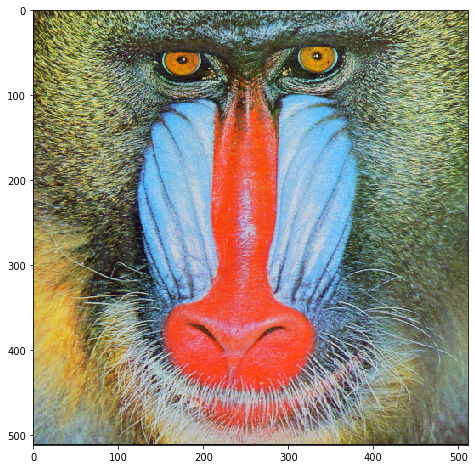

In [ ]:
plt.figure(figsize=(8,8))
plt.imshow(rgb, interpolation='nearest')
plt.show()

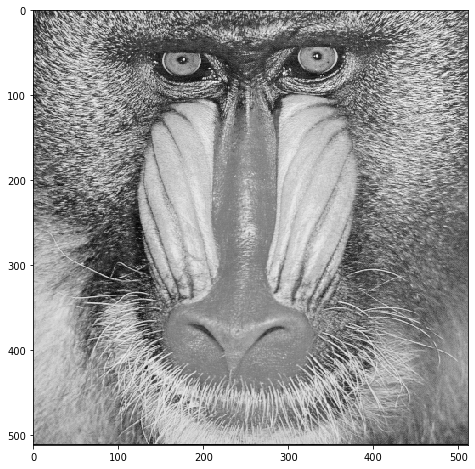

In [ ]:
greyscale = np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])        
plt.figure(figsize=(8,8))
plt.imshow(greyscale, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()

## Question 2
Create a MATLAB GUI to implement Gamma correction on an image using a slider.

In [ ]:
def gammaCorrection(img, gamma):
  correctedImage = np.array((img / 255.0) ** gamma)
  return correctedImage  

In [ ]:
def displayImage(gamma):
  plt.figure(figsize=(8,8))
  updatedImage = gammaCorrection(rgb, gamma)
  plt.imshow(updatedImage, interpolation='nearest')
  plt.show()
  return updatedImage

In [ ]:
interactive(displayImage, {'manual': True}, gamma=widgets.FloatSlider(min=0.0, max=3.0, step=0.05))

interactive(children=(FloatSlider(value=0.0, description='gamma', max=3.0, step=0.05), Button(description='Run…

## Question 3
Manually calculate the histogram of a greyscale image and write a code to perform histogram equalization on the image.


In [ ]:
flatImage = greyscale.flatten()
hist,bins = np.histogram(flatImage, 256, [0,256])

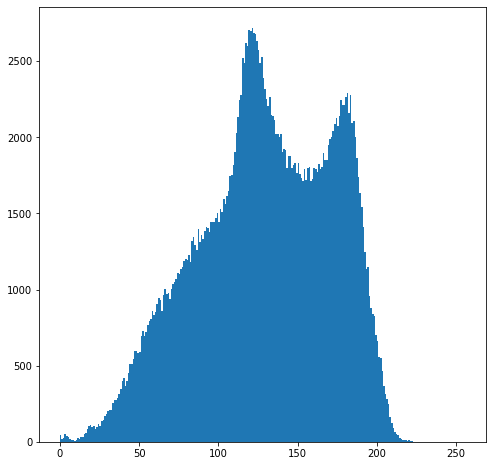

In [ ]:
plt.figure(figsize=(8,8))
plt.hist(flatImage, 256, [0,256])
plt.show()

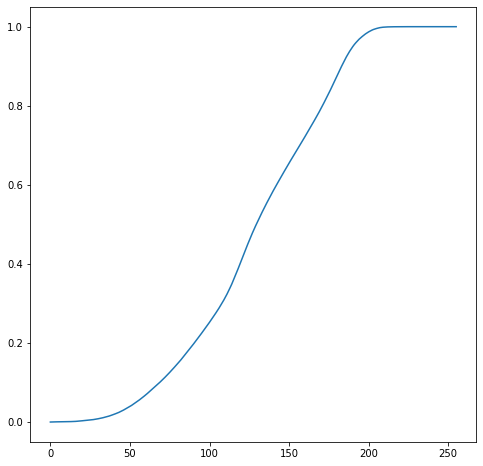

In [ ]:
cdf = np.cumsum(hist) / 262144
plt.figure(figsize=(8,8))
plt.plot(np.arange(0,256),cdf)
plt.show()

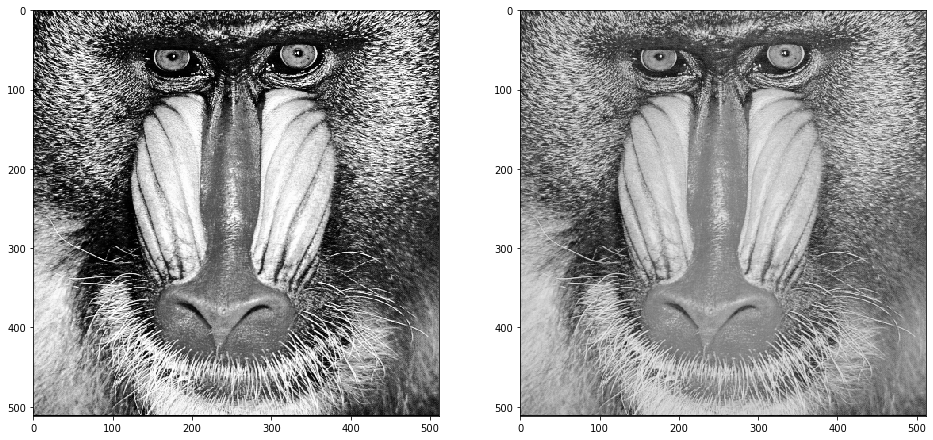

In [ ]:
grayImage = np.array(greyscale, dtype = 'uint8')
equalisedImage = np.array(cdf[grayImage] * 255, dtype = 'uint8')
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(equalisedImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(greyscale, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()

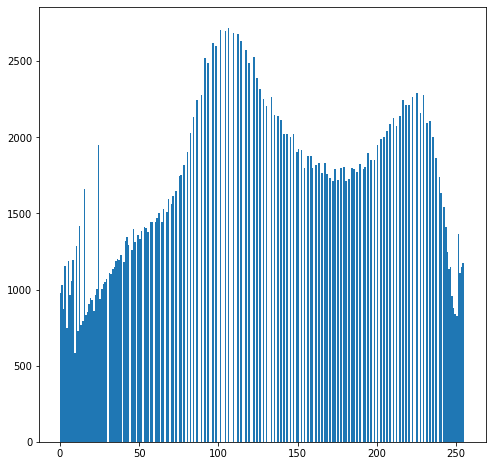

In [ ]:
flatEqualisedImage = equalisedImage.flatten()
histEq,binsEq = np.histogram(flatEqualisedImage, 256, [0,256])
plt.figure(figsize=(8,8))
plt.hist(flatEqualisedImage, 256, [0,256])
plt.show()

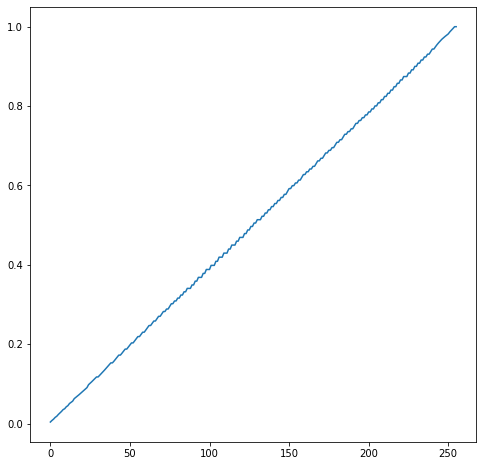

In [ ]:
cdfEq = np.cumsum(histEq) / 262144
plt.figure(figsize=(8,8))
plt.plot(np.arange(0,256),cdfEq)
plt.show()

## Question 4 
 
Implement the following spatial image filters and comment on the effects

&emsp;1. Laplacian Filtering

&emsp;2. Gaussian Smoothing

&emsp;3. Median Filtering

### Laplacian Filtering

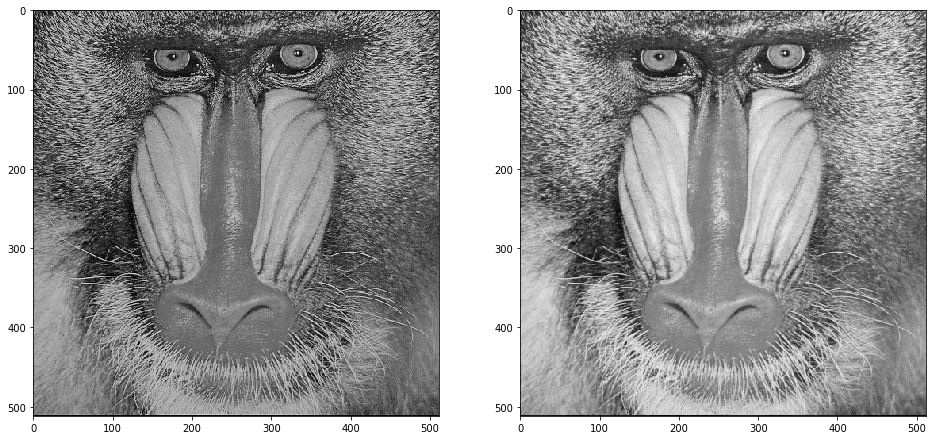

In [ ]:
def laplacianFiltering(image, kernel = [[0, -1, 0], [-1, 8, -1], [0, -1, 0]]):
    filterOutput = ssig.convolve2d(image, kernel, mode='same', boundary='symm')
    finalImage = (image + filterOutput)
    finalImage[finalImage < 0] = 0
    sharpenedImage = np.array(((finalImage * 255) / finalImage.max()), dtype = 'uint8')
    return sharpenedImage

plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(laplacianFiltering(greyscale), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(greyscale, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()   

### Gaussian Filtering

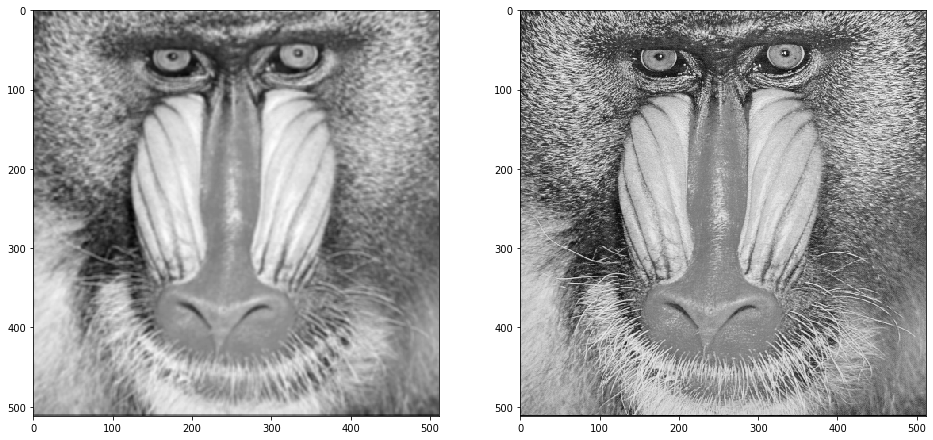

In [ ]:
def gaussianKernel(dim, sigma):
    kernel = np.zeros((dim,dim))
    for x in range(dim):
        for y in range(dim):
            kernel[x][y] = ((1/(2*np.pi*sigma*sigma))*np.exp((-((x-dim//2)*(x-dim//2)+(y-dim//2)*(y-dim//2)))/(2*sigma*sigma)))
       
    return kernel

def gaussianFiltering(image, dim, sigma):
    kernel = gaussianKernel(dim,sigma)
    finalImage = ssig.convolve2d(image, kernel, mode='same', boundary='symm')
    blurredImage = np.array(((finalImage * 255) / finalImage.max()), dtype = 'uint8')
    return blurredImage    

plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(gaussianFiltering(greyscale, 5, 2), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(greyscale, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()       

### Median Filtering

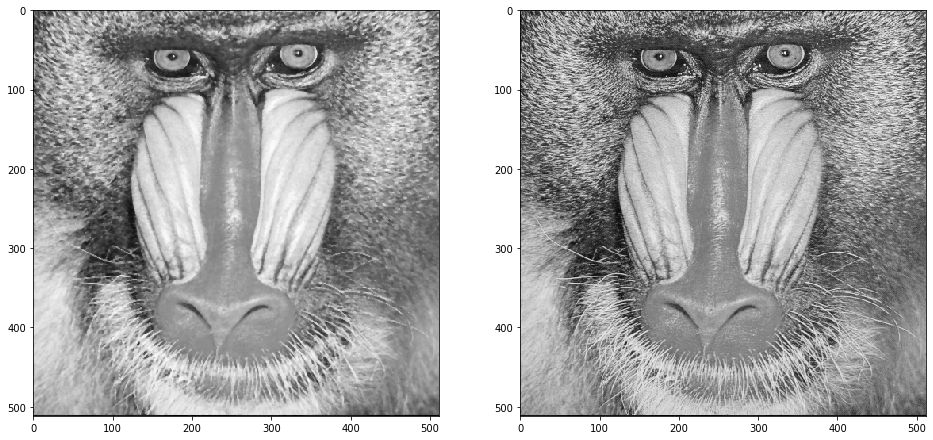

In [ ]:
def medianFiltering(image, dim):
    ## square kernel of odd dimensions    
    imageShape = image.shape
    filteredImage = np.zeros(imageShape)
    kernel = np.zeros(dim * dim)
    padWidth = dim//2
    image = np.pad(image, (padWidth, padWidth), 'edge')
    for x in range(imageShape[0]):
        for y in range(imageShape[1]):
            index=0
            for dx in range(dim):
                for dy in range(dim):
                    kernel[index] = image[x+dx][y+dy]
                    index += 1
            
            kernel.sort()
            filteredImage[x][y] = kernel[(dim * dim)//2]
    
    filteredImage = np.array(filteredImage, dtype='uint8')
    return filteredImage

plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(medianFiltering(greyscale, 3), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(greyscale, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()       

## Question 5
Implement the three filters from the previous questions in the frequency domain using the 2D DFT and using the 2D DCT.

### Laplacian Filtering using DFT

In [ ]:
def laplaceDFT(image, kernel = np.array([[0, -1, 0], [-1, 8, -1], [0, -1, 0]])):
    imageDFT = fftn(image)
    paddedKernel = np.pad(kernel, ((0,image.shape[0]-kernel.shape[0]),(0,image.shape[1]-kernel.shape[1])))
    kernelDFT = fftn(paddedKernel)
    
    laplacianFilteredDFT = imageDFT*kernelDFT
    sharpenedImageDFT = imageDFT + laplacianFilteredDFT
    sharpenedImage = np.real(ifftn(sharpenedImageDFT))
    sharpenedImage[sharpenedImage < 0] = 0
    finalImage = np.array(((sharpenedImage * 255) / sharpenedImage.max()), dtype = 'uint8')
    return finalImage

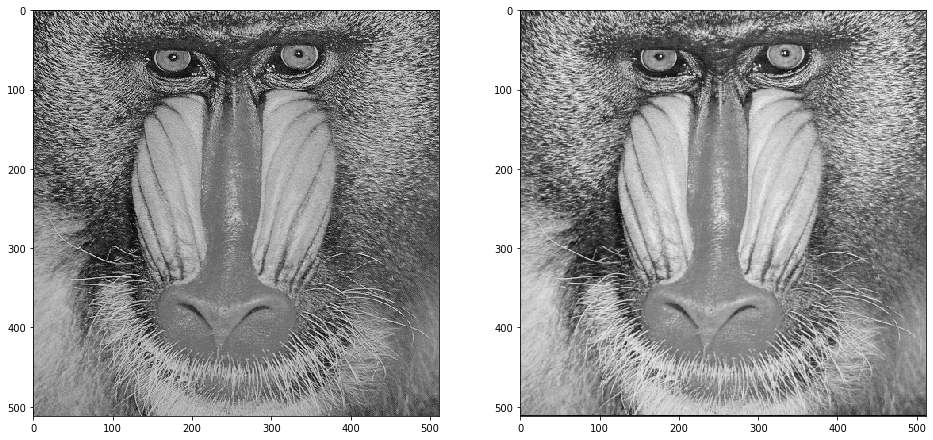

In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(laplaceDFT(greyscale), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(greyscale, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show() 

### Laplacian Filtering using DCT

In [ ]:
def laplaceDCT(image, kernel = np.array([[0, -1, 0], [-1, 8, -1], [0, -1, 0]])):
    imageDCT = dctn(image)
    paddedKernel = np.pad(kernel, ((0,image.shape[0]-kernel.shape[0]),(0,image.shape[1]-kernel.shape[1])))
    kernelDCT= dctn(paddedKernel)
    
    laplacianFilteredDCT = imageDCT*kernelDCT
    sharpenedImageDCT = imageDCT + laplacianFilteredDCT
    sharpenedImage = idctn(sharpenedImageDCT)
    sharpenedImage[sharpenedImage < 0] = 0
    finalImage = np.array(((sharpenedImage * 255) / sharpenedImage.max()), dtype = 'uint8')
    return finalImage

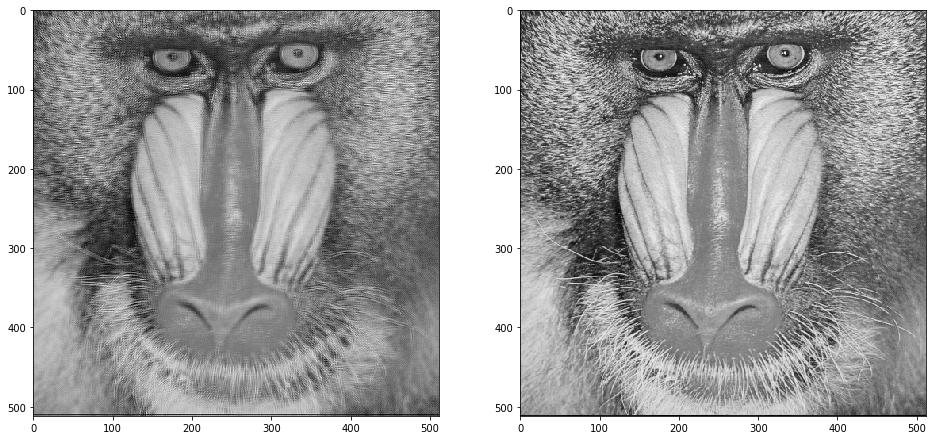

In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(laplaceDCT(greyscale), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(greyscale, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show() 

### Gaussian Filtering using DFT

In [ ]:
def gaussDFT(image, dim, sigma):
    imageDFT = fftn(image)
    kernel = gaussianKernel(dim,sigma)
    paddedKernel = np.pad(kernel, ((0,image.shape[0]-kernel.shape[0]),(0,image.shape[1]-kernel.shape[1])))
    kernelDFT = fftn(paddedKernel)

    gaussianFilteredDFT = imageDFT*kernelDFT
    blurredImage = np.real(ifftn(gaussianFilteredDFT))
    finalImage = np.array(((blurredImage * 255) / blurredImage.max()), dtype='uint8')
    return finalImage 

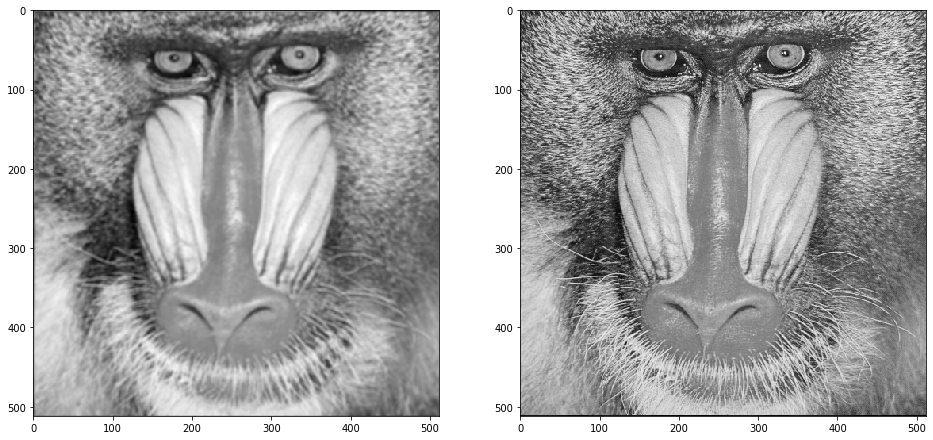

In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(gaussDFT(greyscale, 5, 2), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(greyscale, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show() 

### Gaussian Filtering using DCT

In [ ]:
def gaussDCT(image, dim, sigma):
    imageDCT = dctn(image)
    kernel = gaussianKernel(dim,sigma)
    paddedKernel = np.pad(kernel, ((0,image.shape[0]-kernel.shape[0]),(0,image.shape[1]-kernel.shape[1])))
    kernelDCT = dctn(paddedKernel)

    gaussianFilteredDCT = imageDCT*kernelDCT
    blurredImage = idctn(gaussianFilteredDCT)
    finalImage = np.array(((blurredImage * 255) / blurredImage.max()), dtype='uint8')
    return finalImage

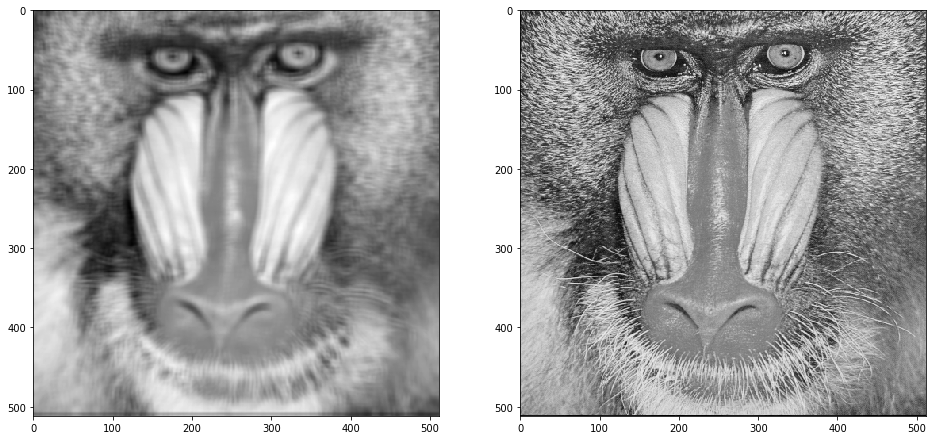

In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(gaussDCT(greyscale, 5, 2), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(greyscale, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show() 

## Question 6
Add salt and pepper noise to the image in question and perform the filtering operations from questions 4 and 5, and comment on the PSNR (peak signal to noise ratio) with and without filtering.

In [ ]:
def addSaltPepperNoise(image, noisePercent):
    noisyImage = image.copy()
    numberOfPoints = int((image.size)*(noisePercent/100))
    x = np.random.randint(0, image.shape[0]-1, numberOfPoints)
    y = np.random.randint(0, image.shape[1]-1, numberOfPoints)
    for i in range(numberOfPoints):
        if (np.random.rand()<=0.5): 
          noisyImage[x[i]][y[i]] = 0 
        else: 
          noisyImage[x[i]][y[i]] = 255
        
    return noisyImage

In [ ]:
def MSE(image, noisyImage):
    return np.sum((np.square(image - noisyImage)))/(image.size)

In [ ]:
def PSNR(image, noisyImage):
    return (20*np.log10(255) - 10*np.log10(MSE(image, noisyImage)))

In [ ]:
noisyImage = addSaltPepperNoise(greyscale, 5)

### Laplacian Filtering

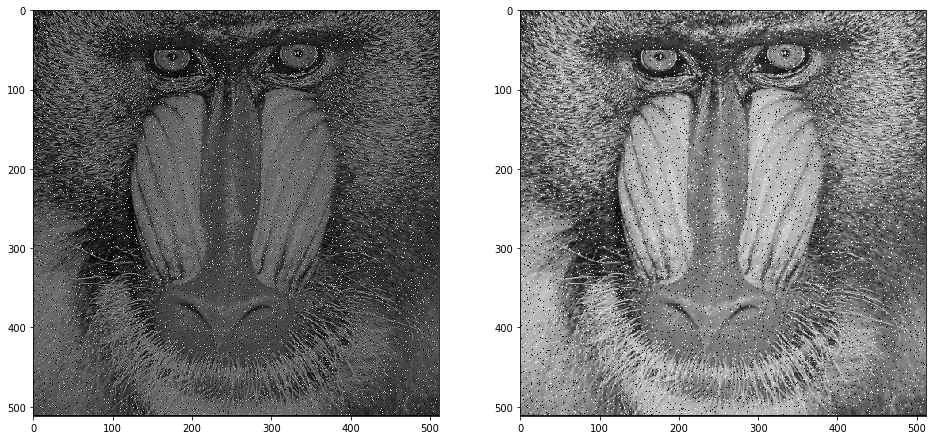

PSNR of filtered noisy image:  12.258331848408126
PSNR of unfiltered noisy image:  18.683494165150982


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(laplacianFiltering(noisyImage), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(noisyImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of filtered noisy image: ', PSNR(greyscale, laplacianFiltering(noisyImage)))
print('PSNR of unfiltered noisy image: ', PSNR(greyscale, noisyImage)) 

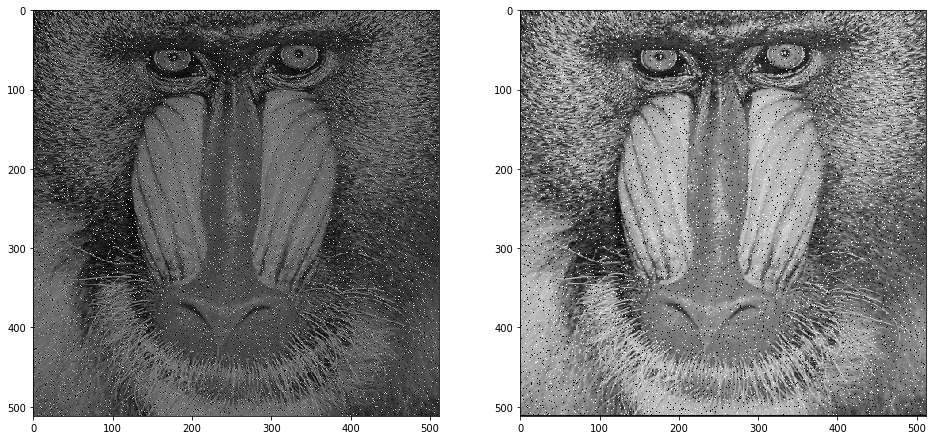

PSNR of filtered noisy image:  11.898836758901737
PSNR of unfiltered noisy image:  18.683494165150982


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(laplaceDFT(noisyImage), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(noisyImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of filtered noisy image: ', PSNR(greyscale, laplaceDFT(noisyImage)))
print('PSNR of unfiltered noisy image: ', PSNR(greyscale, noisyImage)) 

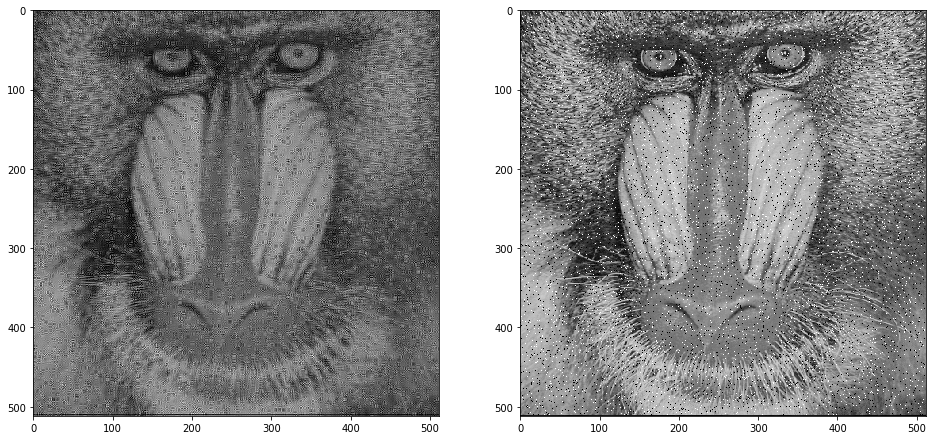

PSNR of filtered noisy image:  14.716546782180394
PSNR of unfiltered noisy image:  18.683494165150982


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(laplaceDCT(noisyImage), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(noisyImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of filtered noisy image: ', PSNR(greyscale, laplaceDCT(noisyImage)))
print('PSNR of unfiltered noisy image: ', PSNR(greyscale, noisyImage)) 

### Gaussian Filtering

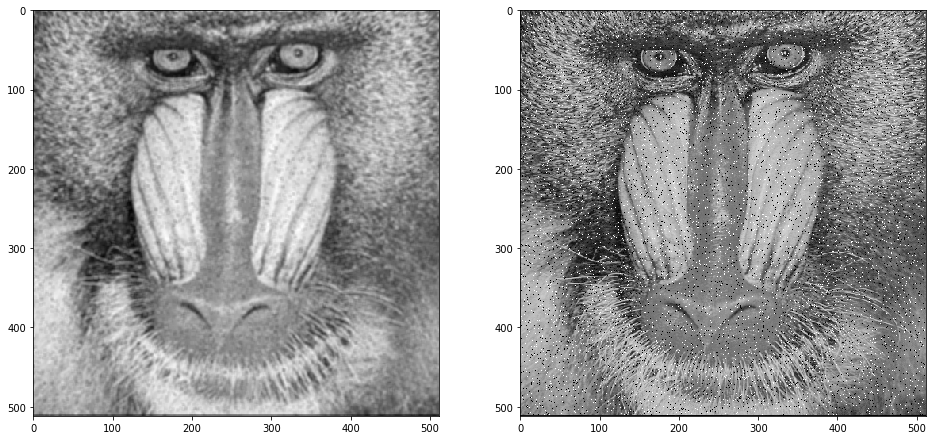

PSNR of filtered noisy image:  17.441393023185288
PSNR of unfiltered noisy image:  18.683494165150982


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(gaussianFiltering(noisyImage, 5, 2), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(noisyImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of filtered noisy image: ', PSNR(greyscale, gaussianFiltering(noisyImage, 5, 2)))
print('PSNR of unfiltered noisy image: ', PSNR(greyscale, noisyImage)) 

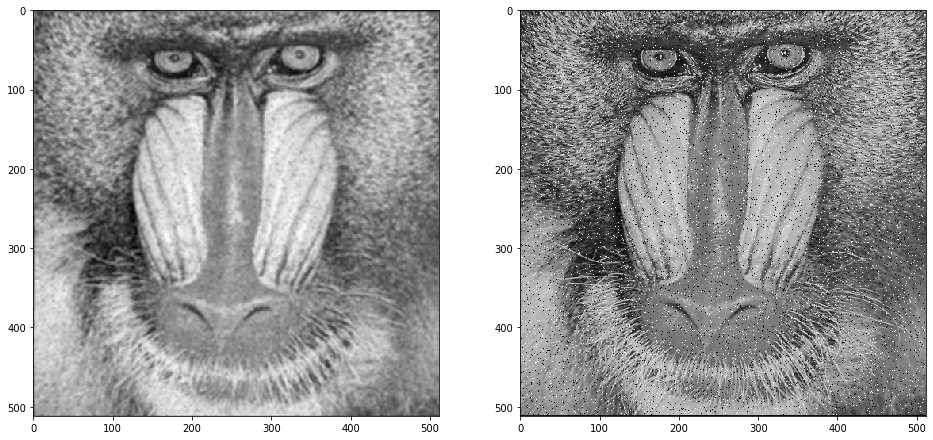

PSNR of filtered noisy image:  16.320222085866632
PSNR of unfiltered noisy image:  18.683494165150982


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(gaussDFT(noisyImage, 5, 2), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(noisyImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of filtered noisy image: ', PSNR(greyscale, gaussDFT(noisyImage, 5, 2)))
print('PSNR of unfiltered noisy image: ', PSNR(greyscale, noisyImage)) 

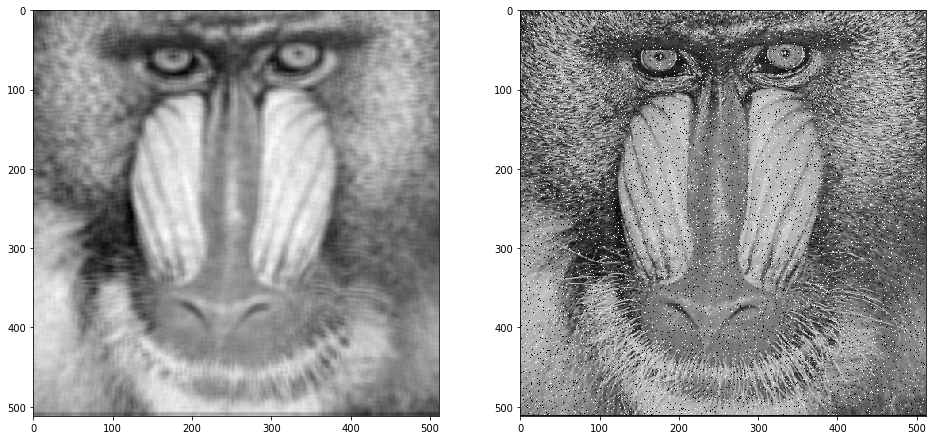

PSNR of filtered noisy image:  15.545469870232722
PSNR of unfiltered noisy image:  18.683494165150982


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(gaussDCT(noisyImage, 5, 2), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(noisyImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of filtered noisy image: ', PSNR(greyscale, gaussDCT(noisyImage, 5, 2)))
print('PSNR of unfiltered noisy image: ', PSNR(greyscale, noisyImage)) 

### Median Filtering

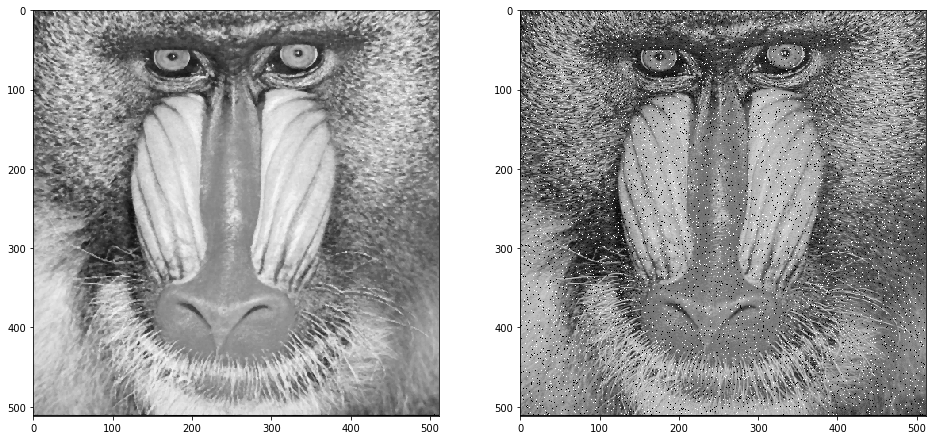

PSNR of filtered noisy image:  23.5460671904667
PSNR of unfiltered noisy image:  18.683494165150982


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(medianFiltering(noisyImage, 3), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(noisyImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of filtered noisy image: ', PSNR(greyscale, medianFiltering(noisyImage, 3)))
print('PSNR of unfiltered noisy image: ', PSNR(greyscale, noisyImage)) 

## Question 7
Implement the following algorithm

&emsp;1. Take the DCT of an image.

&emsp;2. Choose only the first K low frequency components and force everything else to zero.

&emsp;3. Reconstruct the image using these low frequency components and calculate the PSNR.

&emsp;4. Plot the PSNR as a function of K and record your observations.

In [ ]:
def imageCompressionLow(image, k):
    imageDCT = dctn(image)
    sortedDCT = np.sort(imageDCT.flatten())

    for x in range(imageDCT.shape[0]):
        for y in range(imageDCT.shape[1]):
            if(imageDCT[x][y] > sortedDCT[k-1]):
                imageDCT[x][y] = 0

    compressedImage = idctn(imageDCT)
    return compressedImage

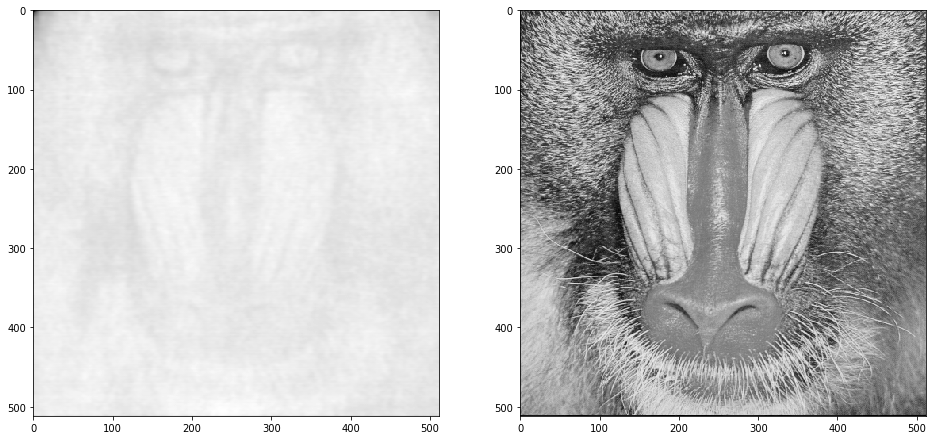

PSNR of compressed image (k-Low):  5.593887144747242


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(imageCompressionLow(greyscale, 1000), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(greyscale, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of compressed image (k-Low): ', PSNR(greyscale, imageCompressionLow(greyscale, 1000)))

In [ ]:
Ks = np.linspace(1, 4999, 2500, dtype = int)
Ks = np.concatenate((Ks, np.linspace(5000, 20000, 101, dtype = int)))
Ks = np.concatenate((Ks, np.linspace(20001, greyscale.size - 20000, 101, dtype = int)))
Ks = np.concatenate((Ks, np.linspace(greyscale.size - 19999, greyscale.size - 4999, 101, dtype = int)))
Ks = np.concatenate((Ks, np.linspace(greyscale.size - 4998, greyscale.size, 2500, dtype = int)))

In [ ]:
PSNRs = np.zeros(Ks.size)
for index in range(Ks.size):
    PSNRs[index] = PSNR(greyscale, imageCompressionLow(greyscale, Ks[index]))

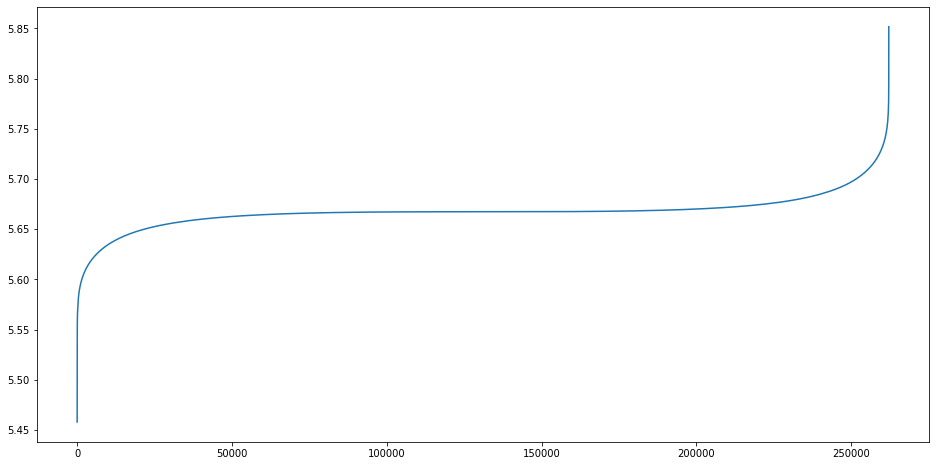

In [ ]:
plt.figure(figsize=(16,8))
plt.plot(Ks[:Ks.size - 1], PSNRs[:Ks.size - 1])
plt.show()

## Question 8
Repeat Question 6 using 8 x 8 blocks of the image. 

### Laplacian Filtering

In [ ]:
def laplacianFiltering8x8(image):
    x = 0
    y = 0
    filteredImage = np.zeros(image.shape)
    while x < image.shape[0]-1:
        while y < image.shape[1]-1:
            filteredImage[x:x+8, y:y+8] = laplacianFiltering(image[x:x+8, y:y+8])
            y += 8
        y = 0
        x += 8
    return filteredImage

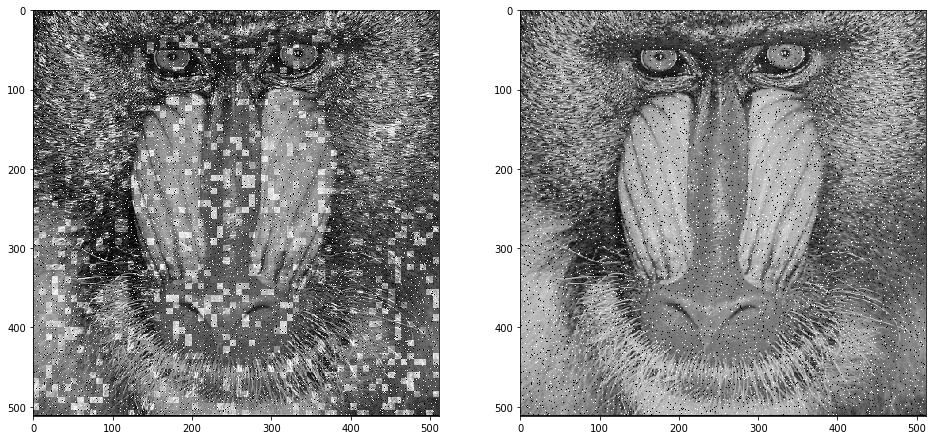

PSNR of filtered noisy image:  14.519853043431056
PSNR of unfiltered noisy image:  18.683494165150982


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(laplacianFiltering8x8(noisyImage), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(noisyImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of filtered noisy image: ', PSNR(greyscale, laplacianFiltering8x8(noisyImage)))
print('PSNR of unfiltered noisy image: ', PSNR(greyscale, noisyImage)) 

In [ ]:
def laplaceDFT8x8(image):
    x = 0
    y = 0
    filteredImage = np.zeros(image.shape)
    while x < image.shape[0]-1:
        while y < image.shape[1]-1:
            filteredImage[x:x+8, y:y+8] = laplaceDFT(image[x:x+8, y:y+8])
            y += 8
        y = 0
        x += 8
    return filteredImage

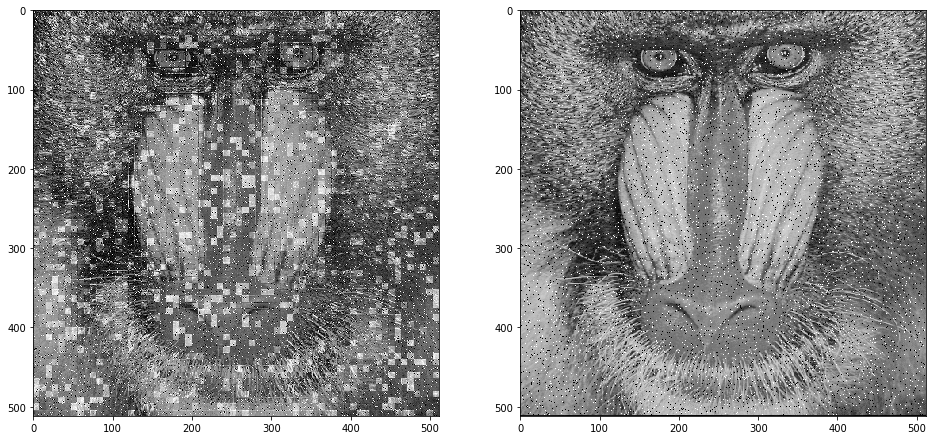

PSNR of filtered noisy image:  13.023208644395623
PSNR of unfiltered noisy image:  18.683494165150982


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(laplaceDFT8x8(noisyImage), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(noisyImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of filtered noisy image: ', PSNR(greyscale, laplaceDFT8x8(noisyImage)))
print('PSNR of unfiltered noisy image: ', PSNR(greyscale, noisyImage)) 

In [ ]:
def laplaceDCT8x8(image):
    x = 0
    y = 0
    filteredImage = np.zeros(image.shape)
    while x < image.shape[0]-1:
        while y < image.shape[1]-1:
            filteredImage[x:x+8, y:y+8] = laplaceDCT(image[x:x+8, y:y+8])
            y += 8
        y = 0
        x += 8
    return filteredImage

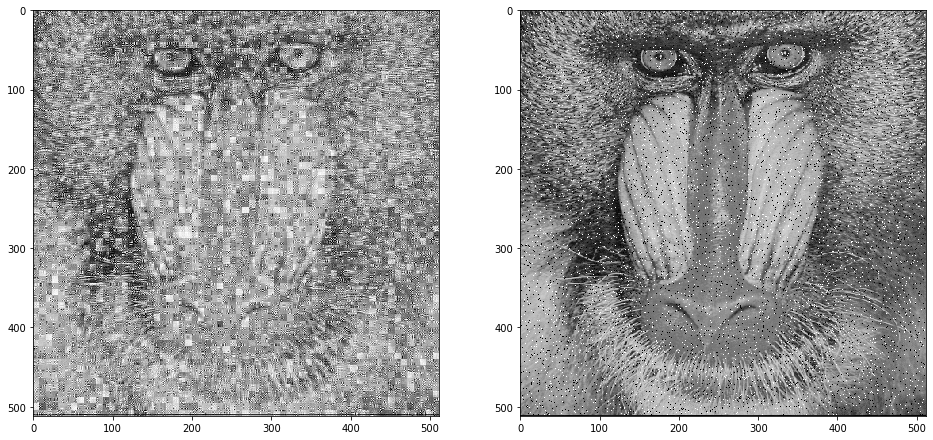

PSNR of filtered noisy image:  12.918421253896895
PSNR of unfiltered noisy image:  18.683494165150982


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(laplaceDCT8x8(noisyImage), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(noisyImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of filtered noisy image: ', PSNR(greyscale, laplaceDCT8x8(noisyImage)))
print('PSNR of unfiltered noisy image: ', PSNR(greyscale, noisyImage)) 

### Gaussian Filtering

In [ ]:
def gaussianFiltering8x8(image, dim, sigma):
    x = 0
    y = 0
    filteredImage = np.zeros(image.shape)
    while x < image.shape[0]-1:
        while y < image.shape[1]-1:
            filteredImage[x:x+8, y:y+8] = gaussianFiltering(image[x:x+8, y:y+8], dim, sigma)
            y += 8
        y = 0
        x += 8
    return filteredImage

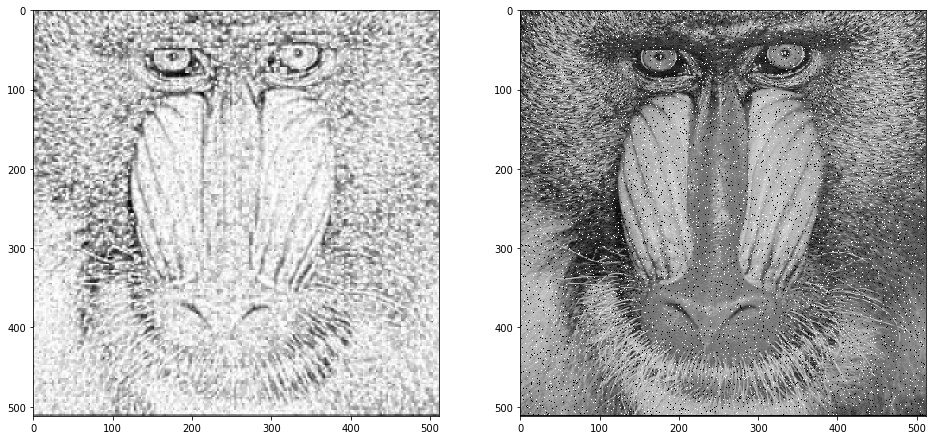

PSNR of filtered noisy image:  9.354939383076434
PSNR of unfiltered noisy image:  18.683494165150982


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(gaussianFiltering8x8(noisyImage, 5, 2), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(noisyImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of filtered noisy image: ', PSNR(greyscale, gaussianFiltering8x8(noisyImage, 5, 2)))
print('PSNR of unfiltered noisy image: ', PSNR(greyscale, noisyImage)) 

In [ ]:
def gaussDFT8x8(image, dim, sigma):
    x = 0
    y = 0
    filteredImage = np.zeros(image.shape)
    while x < image.shape[0]-1:
        while y < image.shape[1]-1:
            filteredImage[x:x+8, y:y+8] = gaussDFT(image[x:x+8, y:y+8], dim, sigma)
            y += 8
        y = 0
        x += 8
    return filteredImage

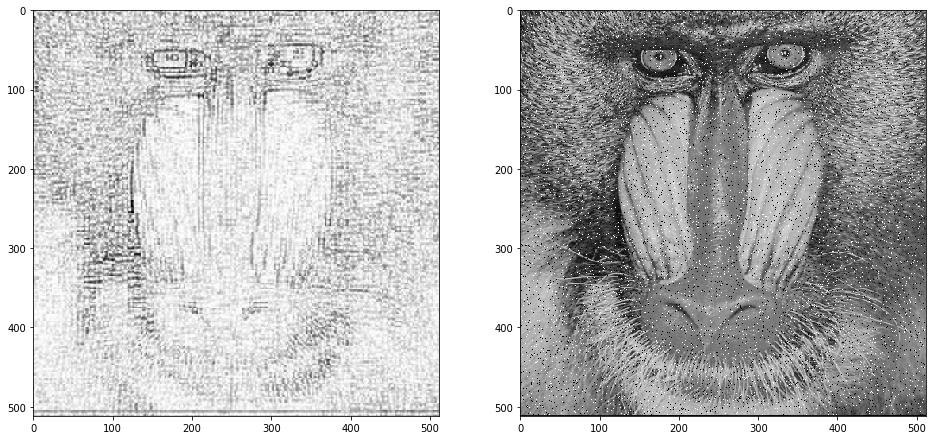

PSNR of filtered noisy image:  7.915188943165994
PSNR of unfiltered noisy image:  18.683494165150982


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(gaussDFT8x8(noisyImage, 5, 2), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(noisyImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of filtered noisy image: ', PSNR(greyscale, gaussDFT8x8(noisyImage, 5, 2)))
print('PSNR of unfiltered noisy image: ', PSNR(greyscale, noisyImage)) 

In [ ]:
def gaussDCT8x8(image, dim, sigma):
    x = 0
    y = 0
    filteredImage = np.zeros(image.shape)
    while x < image.shape[0]-1:
        while y < image.shape[1]-1:
            filteredImage[x:x+8, y:y+8] = gaussDCT(image[x:x+8, y:y+8], dim, sigma)
            y += 8
        y = 0
        x += 8
    return filteredImage

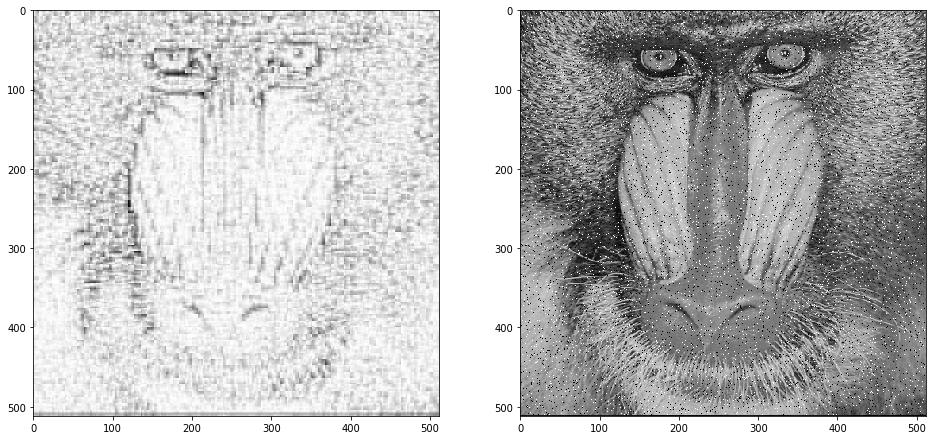

PSNR of filtered noisy image:  7.468968093571718
PSNR of unfiltered noisy image:  18.683494165150982


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(gaussDCT8x8(noisyImage, 5, 2), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(noisyImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of filtered noisy image: ', PSNR(greyscale, gaussDCT8x8(noisyImage, 5, 2)))
print('PSNR of unfiltered noisy image: ', PSNR(greyscale, noisyImage)) 

### Median Filtering

In [ ]:
def medianFiltering8x8(image, dim):
    x = 0
    y = 0
    filteredImage = np.zeros(image.shape)
    while x < image.shape[0]-1:
        while y < image.shape[1]-1:
            filteredImage[x:x+8, y:y+8] = medianFiltering(image[x:x+8, y:y+8], dim)
            y += 8
        y = 0
        x += 8
    return filteredImage

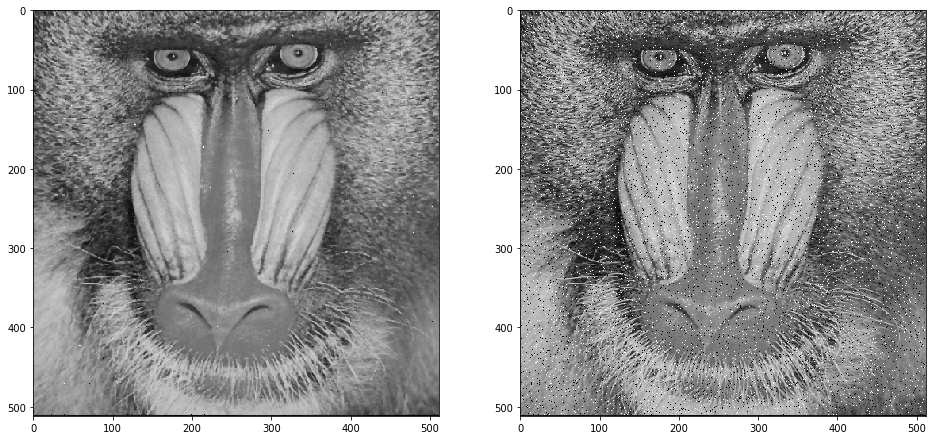

PSNR of filtered noisy image:  23.89173457976686
PSNR of unfiltered noisy image:  18.683494165150982


In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(medianFiltering8x8(noisyImage, 3), cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.subplot(122)
plt.imshow(noisyImage, cmap=plt.get_cmap('gray'), interpolation='nearest')
plt.show()
print('PSNR of filtered noisy image: ', PSNR(greyscale, medianFiltering8x8(noisyImage, 3)))
print('PSNR of unfiltered noisy image: ', PSNR(greyscale, noisyImage))